In [4]:
from cnmf import cNMF
import numpy as np
import pandas as pd
import os
import scanpy as sc

import matplotlib.pyplot as plt

# Assemble cNMF data
Following tutorial from: https://github.com/dylkot/cNMF

Use the bash script instead for submitting jobs to LSF. Specifically, cnma prepare and cnmf factorize needs to be run with 2_runcNMF.sh, matching the results folders.

In [5]:
# Specify cNMF output folder
cnmf_obj = cNMF(output_dir="./results", name="fibroblast_cNMF")

In [6]:
# Combine results across k values tested
cnmf_obj.combine()

Combining factorizations for k=5.
Combining factorizations for k=6.
Combining factorizations for k=7.
Combining factorizations for k=8.
Combining factorizations for k=9.
Combining factorizations for k=10.
Combining factorizations for k=11.
Combining factorizations for k=12.
Combining factorizations for k=13.
Combining factorizations for k=14.
Combining factorizations for k=15.
Combining factorizations for k=16.
Combining factorizations for k=17.
Combining factorizations for k=18.
Combining factorizations for k=19.
Combining factorizations for k=20.
Combining factorizations for k=21.
Combining factorizations for k=22.
Combining factorizations for k=23.
Combining factorizations for k=24.
Combining factorizations for k=25.


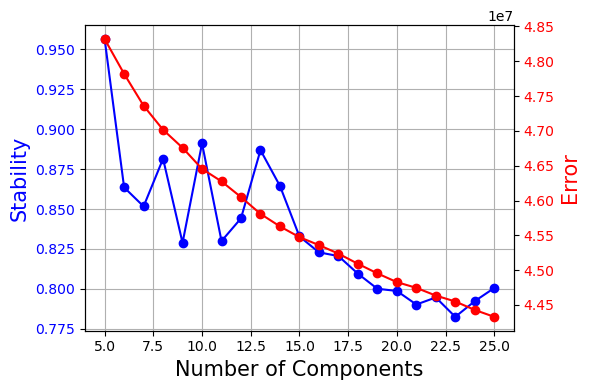

In [7]:
# Plot stability-error tradeoff to help assess number of components k
cnmf_obj.k_selection_plot(close_fig=False)

## Determine number of components, k

In [8]:
# select optimal k
#k = 13

k = 17

#k = 20

/home/jovyan/my-conda-envs/ni_env2/lib/python3.10/site-packages/cnmf/cnmf.py:772: RuntimeWarning: invalid value encountered in divide
  norm_tpm = (np.array(tpm.X.todense()) - tpm_stats['__mean'].values) / tpm_stats['__std'].values
/home/jovyan/my-conda-envs/ni_env2/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


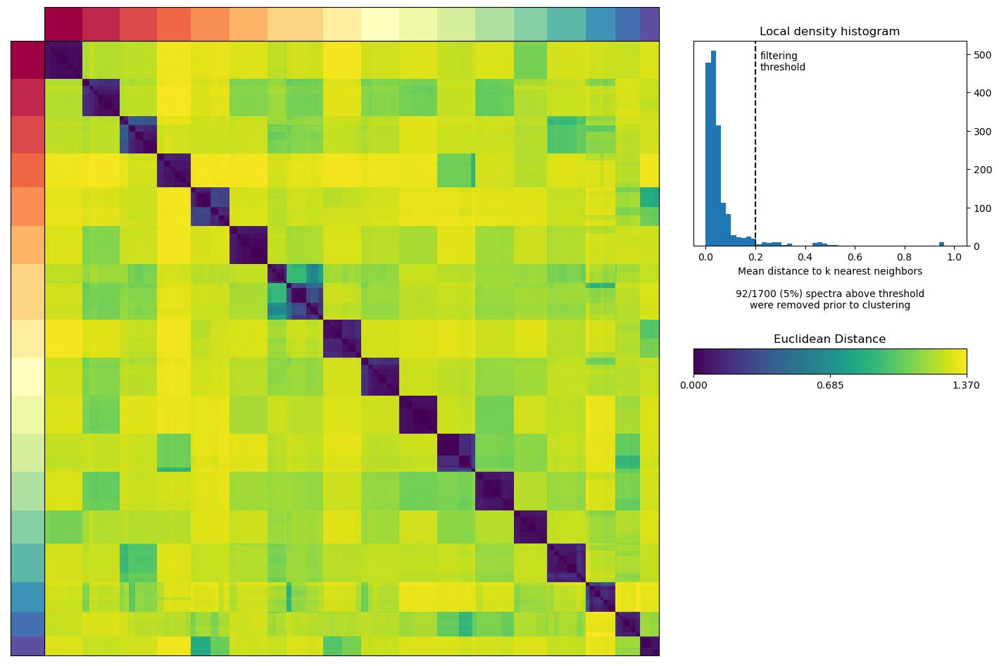

In [9]:
# Plot consistency of cNMF components by clustering consensus estimates for gene programs
cnmf_obj.consensus(k=k, density_threshold=0.2)

In [10]:
# Extract data for given k
usage, spectra_scores, spectra_tpm, top_genes = cnmf_obj.load_results(K=k, density_threshold=0.2)

In [11]:
#usage

In [12]:
#spectra_scores

In [13]:
# pd.set_option('display.max_rows', 50)
# top_genes

In [14]:
# Write top-100 genes to table
top_genes.to_csv("results/cNMF_k" + str(k) + "_top_genes.csv", index=False)

In [15]:
spectra_scores

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
AL627309.1,0.000045,-0.000017,0.000271,1.997887e-07,-0.000091,-0.000098,-0.000074,-0.000063,-0.000036,0.000063,-0.000009,-0.000100,-0.000059,-0.000120,-0.000028,0.000107,-2.470636e-05
AL669831.5,-0.000170,-0.000036,0.000645,-9.630837e-05,-0.000129,-0.000020,-0.000223,-0.000154,-0.000128,-0.000005,-0.000016,0.000110,-0.000016,-0.000233,0.000326,0.000744,-1.118246e-05
FAM87B,-0.000018,-0.000087,0.000269,-8.261776e-05,-0.000041,-0.000097,-0.000072,0.000069,-0.000025,0.000157,0.000035,0.000038,-0.000073,0.000044,-0.000047,0.000055,-8.926566e-05
LINC00115,-0.000190,0.000026,0.000541,-1.569890e-04,-0.000134,-0.000108,-0.000109,0.000097,-0.000112,0.000194,0.000055,-0.000201,-0.000064,-0.000145,0.000278,-0.000002,2.544851e-07
FAM41C,-0.000213,0.000024,0.000029,-4.882318e-05,0.000121,0.000020,-0.000100,-0.000154,-0.000151,0.000070,0.000284,0.000115,0.000005,-0.000098,0.000285,0.000300,2.977847e-04
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AC011043.1,-0.000170,0.000047,-0.000072,-1.260543e-04,-0.000125,-0.000026,-0.000113,0.000712,-0.000138,0.000101,-0.000113,0.000300,0.000119,0.000034,-0.000039,0.000025,-2.126259e-05
AL592183.1,-0.000189,-0.000055,0.000184,8.088070e-05,-0.000039,0.000059,-0.000229,0.000260,-0.000173,0.000025,0.000004,-0.000013,0.000114,-0.000187,0.000239,0.000414,-1.164613e-04
AC007325.4,-0.000197,0.000220,-0.000422,8.375879e-06,-0.000059,0.000346,-0.000244,-0.000224,0.000116,0.000092,0.000240,-0.000063,-0.000070,-0.000025,0.000310,0.000369,-1.063692e-06
AL354822.1,0.000244,-0.000048,0.000818,-2.738714e-04,-0.000367,-0.000183,-0.000213,0.000050,-0.000258,0.000046,0.000034,0.000131,0.000162,-0.000287,0.000164,-0.000155,6.645758e-05


In [16]:
spectra_scores.to_csv("results/cNMF_k" + str(k) + "_spectra.csv")

# Joint analysis of cNMF usage matrix with anndata object

In [17]:
# Load raw data, containing cell barcode index
adata_raw = sc.read('../data/rna/scRNA_batch1_2.raw.h5ad')

# Load anndata object, used for plotting UMAP and cell type annotations
adata = sc.read_h5ad("../data/rna/scRNA_batch1_2.processed.fibroblasts.h5ad")

## Format cNMF usage rows and columns

In [18]:
# Rename usage columns prepending 'cNMF_'
usage.columns = ["cNMF_" + str(x) for x in usage.columns]

# convert from relative cell index to cell barcode
usage.index = adata_raw.obs.index[usage.index]

usage

,cNMF_1,cNMF_2,cNMF_3,cNMF_4,cNMF_5,cNMF_6,cNMF_7,cNMF_8,cNMF_9,cNMF_10,cNMF_11,cNMF_12,cNMF_13,cNMF_14,cNMF_15,cNMF_16,cNMF_17
index,,,,,,,,,,,,,,,,,
AAACCCATCGTGCTCT-R01,0.000000,0.000000,0.379819,0.078758,0.066123,0.000000,0.045238,0.000000,0.002460,0.088954,0.221932,0.008049,0.005603,0.069986,0.000000,0.010475,0.022604
AAACGAACATGTTACG-R01,0.001112,0.100652,0.355637,0.000438,0.178343,0.010550,0.000000,0.015048,0.100208,0.000000,0.002104,0.044738,0.000000,0.118254,0.000000,0.010241,0.062675
AAACGAAGTTCCGTTC-R01,0.000000,0.000000,0.388049,0.005181,0.005009,0.233179,0.057906,0.000000,0.226001,0.041547,0.000000,0.000000,0.043127,0.000000,0.000000,0.000000,0.000000
AAACGCTGTCGTTGGC-R01,0.000000,0.000000,0.267401,0.102819,0.077223,0.266813,0.000000,0.000000,0.274481,0.000169,0.000000,0.000000,0.011094,0.000000,0.000000,0.000000,0.000000
AAAGAACCACAAGGTG-R01,0.000000,0.246921,0.337945,0.114195,0.000000,0.054812,0.000000,0.032824,0.050793,0.000000,0.008524,0.062501,0.000000,0.048759,0.014721,0.027792,0.000213
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGTTCATTCGATG-R13,0.000000,0.000000,0.365404,0.442002,0.000000,0.000000,0.000000,0.000000,0.159478,0.000000,0.031098,0.000000,0.000000,0.000000,0.000000,0.002018,0.000000
TTTGGTTGTACTAGCT-R13,0.054508,0.000000,0.086466,0.489977,0.058370,0.000000,0.000179,0.113487,0.081347,0.002147,0.014060,0.021455,0.000000,0.069963,0.008040,0.000000,0.000000
TTTGGTTTCGTGGACC-R13,0.000000,0.000000,0.060474,0.490720,0.024930,0.145136,0.000000,0.051791,0.091852,0.000000,0.028127,0.000000,0.063010,0.021428,0.014568,0.000000,0.007965


In [21]:
!mkdir -p data

In [22]:
# Write annotated and normalized cNMF usage
usage_annot = adata.obs[['annot1']].join(usage)
usage_annot.to_csv("data/RNAseq_cNMF_usage_k" + str(k) + ".csv")

In [19]:
# left join cNMF usage per cell
adata.obs = adata.obs.join(usage)

## Plots

/home/jovyan/my-conda-envs/ni_env2/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


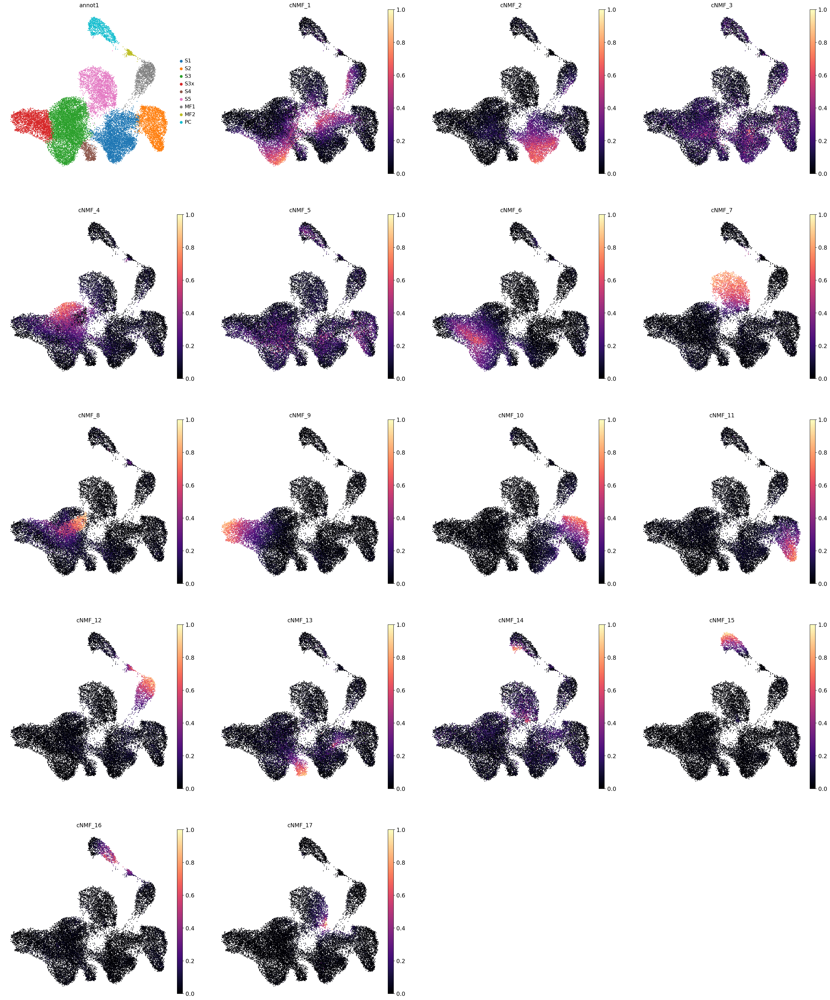

In [173]:
# UMAP plots colored by cNMF usage
sc.set_figure_params(dpi_save=150, figsize=(8, 8))

# without outline
sc.pl.umap(
    adata,
    color=['annot1'] + usage.columns.to_list(),
    palette='tab10',
    cmap='magma',
    frameon=False,
    vmax=1.0,
    vmin=0.0,
    size=15,  # point size
    save='_fibroblasts_cNMF_usage.pdf'  # in ./figures
)

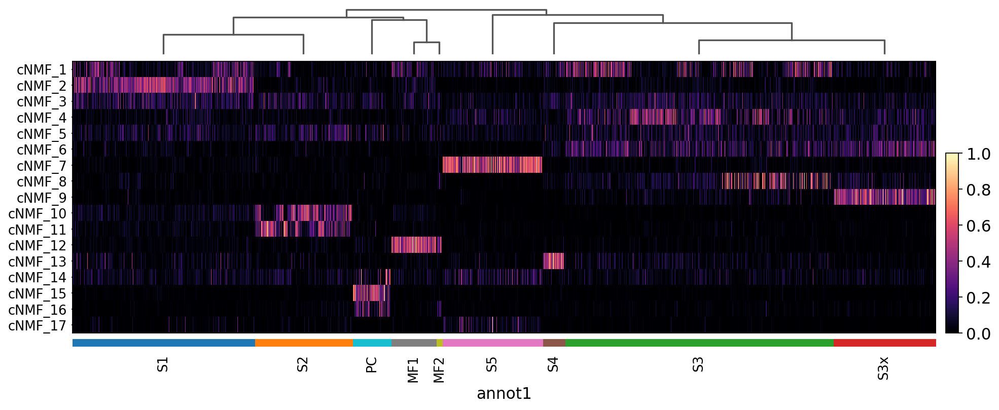

In [174]:
# Heatmap of cNMF usage by cell type
sc.set_figure_params(dpi_save=300)
sc.pl.heatmap(
    adata,
    var_names=usage.columns,
    groupby='annot1',
    dendrogram=True,
    swap_axes=True,
    cmap="magma",
    figsize=(14, 5.5),
    save="_fibroblasts_cNMF_usage.pdf"
)